In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from mpl_toolkits.basemap import Basemap
from itertools import chain
import math
%matplotlib inline

# Project WP1-2
### code 5: extract routes between specific regions
<span style='font-family:"Times New Roman"'> <span styel=''> 
    
This code is based on dataset "ais_3000nm_weather.csv" and "ports_update1.csv". 
Extract all the specific routes betwee differnet regions, ready for the next step in waypoints extracting. 
    
### Basic steps: 
    a) Load and check data;
    b) functions for data extraction;
    c) cases presentation;
    d) Save data and show cases;
Overall, 600 csv data files are saved for further utilising. 

# a) Load and check data

ports information is merged into the ais_3000nm_weather file

In [190]:
df_longJ=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/cleanedData/ais_3000nm_weather.csv")
df_ports=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/cleanedData/ports_update1.csv")
df_journey=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/fleet_trade_journeys.csv")

In [12]:
df_longJ

,ais_position_id,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
0,5811207,2014-01-01 23:48:12,41.93912,139.07770,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
1,8821505,2014-01-02 23:24:23,39.15283,142.35820,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2,13536291,2014-01-03 23:53:30,34.64402,139.67570,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
3,19155353,2014-01-04 23:56:46,34.03151,134.98734,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
4,24344334,2014-01-05 22:27:52,34.55417,135.43150,9301407.0,9301407.0,Viktor Titov,285689023,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,2014-02-03 01:15:37,De Kastri,Russia,4364.329539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2190867,25848553475,2019-03-15 23:59:20,1.48693,149.78317,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2190868,25862262642,2019-03-16 23:49:32,-2.61357,153.04519,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2190869,25875803276,2019-03-17 23:28:16,-6.77629,156.28137,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2190870,25890184605,2019-03-18 23:30:27,-8.92604,159.37613,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353


In [191]:
# new ports_dataframe for the sake of dataframe merging. 
df_ports_start=df_ports[["Region","Terminal","Lat","Lon","num of call all","Port Group"]]
df_ports_end=df_ports[["Region","Terminal","Lat","Lon","num of call all","Port Group"]]

#change columns name
df_ports_start.columns=["start_region","journey_start_location_name","start_lat","start_lon","start_calls","start_group"]
df_ports_end.columns=["end_region","journey_end_location_name","end_lat","end_lon","end_calls","end_group"]

# merge dataframes, adding new start/end information into the ais journey. 
df_merge=pd.merge(df_longJ,df_ports_start,on='journey_start_location_name',how='left')
df_merge=pd.merge(df_merge,df_ports_end,on="journey_end_location_name",how="left")

df_ports_start

,start_region,journey_start_location_name,start_lat,start_lon,start_calls,start_group
0,SE Asia,Singapore,1.20470,103.67232,14768,Singapore
1,Baltic,PTP Terminal,60.32058,28.72898,7566,PTP Terminal
2,Black sea,Novorossiysk,44.72680,37.78154,7524,Novorossiysk
3,NE Asia,Yeosu,34.71473,127.81125,7078,Yeosu
4,Gulf,Houston,29.23550,-94.62350,6746,Houston
...,...,...,...,...,...,...
3283,SW Europe,Silopor Trafaria Bulk Food Terminal,38.67722,-9.23714,1,Sines Liquid Bulk Terminal
3284,Oceania,New Zealand,-35.73105,176.29282,1,Marsden Point Refinery
3285,SE Ame,Liberty Terminal,32.07858,-81.06926,1,Charleston
3286,SE Ame,Detyens Shipyard,32.86096,-79.95956,1,Charleston


In [192]:
df_merge

,ais_position_id,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,...,start_region,start_lat,start_lon,start_calls,start_group,end_region,end_lat,end_lon,end_calls,end_group
0,5811207,2014-01-01 23:48:12,41.93912,139.07770,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,...,NE Asia,42.76545,132.92307,1121.0,Transneft Kozmino Terminal,NE Asia,34.55588,135.42885,150.0,Sakai
1,8821505,2014-01-02 23:24:23,39.15283,142.35820,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,...,NE Asia,42.76545,132.92307,1121.0,Transneft Kozmino Terminal,NE Asia,34.55588,135.42885,150.0,Sakai
2,13536291,2014-01-03 23:53:30,34.64402,139.67570,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,...,NE Asia,42.76545,132.92307,1121.0,Transneft Kozmino Terminal,NE Asia,34.55588,135.42885,150.0,Sakai
3,19155353,2014-01-04 23:56:46,34.03151,134.98734,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,...,NE Asia,42.76545,132.92307,1121.0,Transneft Kozmino Terminal,NE Asia,34.55588,135.42885,150.0,Sakai
4,24344334,2014-01-05 22:27:52,34.55417,135.43150,9301407.0,9301407.0,Viktor Titov,285689023,2014-01-05 14:27:16,JXTG Sakai Refinery,...,NE Asia,34.55588,135.42885,150.0,Sakai,NE Asia,51.45277,140.92767,1042.0,De Kastri
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2190867,25848553475,2019-03-15 23:59:20,1.48693,149.78317,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,...,NE Asia,34.71473,127.81125,7078.0,Yeosu,Oceania,-9.42937,159.95915,390.0,Honiara
2190868,25862262642,2019-03-16 23:49:32,-2.61357,153.04519,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,...,NE Asia,34.71473,127.81125,7078.0,Yeosu,Oceania,-9.42937,159.95915,390.0,Honiara
2190869,25875803276,2019-03-17 23:28:16,-6.77629,156.28137,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,...,NE Asia,34.71473,127.81125,7078.0,Yeosu,Oceania,-9.42937,159.95915,390.0,Honiara
2190870,25890184605,2019-03-18 23:30:27,-8.92604,159.37613,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,...,NE Asia,34.71473,127.81125,7078.0,Yeosu,Oceania,-9.42937,159.95915,390.0,Honiara


In [193]:
ports_main=len(df_ports["Port Group"].unique())
print ("------------------------------------------------------------------------------------------------------------------")
print ("the number of main ports around the world (grouped terminals):", ports_main)
print ("------------------------------------------------------------------------------------------------------------------")
print ("the number of main ports in start terminals for a journey longer than 3000nm:",len(df_merge["start_group"].unique()))
print ("------------------------------------------------------------------------------------------------------------------")
print ("the number of main ports in end terminals for a journey longer than 3000nm:",len(df_merge["end_group"].unique()))
print ("------------------------------------------------------------------------------------------------------------------")

------------------------------------------------------------------------------------------------------------------
the number of main ports around the world (grouped terminals): 518
------------------------------------------------------------------------------------------------------------------
the number of main ports in start terminals for a journey longer than 3000nm: 450
------------------------------------------------------------------------------------------------------------------
the number of main ports in end terminals for a journey longer than 3000nm: 442
------------------------------------------------------------------------------------------------------------------


# Step b) functions for routes extacting between different regions and visulization

In [244]:
def draw_map(m, scale=0.5):
    """
    plot backgroud map
    m: Basemap object
    scale: plot scale
    return: plot a backgroud map
    """
    # draw a shaded-relief image
    m.shadedrelief(scale=scale)
    #m.bluemarble(scale=scale)  #Project NASA's blue marble image onto the map
    #m.drawcoastlines()
    
    # lats and longs are returned as a dictionary
    lats = m.drawparallels(np.linspace(-90, 90, 13))
    lons = m.drawmeridians(np.linspace(-180, 180, 13))

    # keys contain the plt.Line2D instances
    lat_lines = chain(*(tup[1][0] for tup in lats.items()))
    lon_lines = chain(*(tup[1][0] for tup in lons.items()))
    all_lines = chain(lat_lines, lon_lines)
    
    # cycle through these lines and set the desired style
    for line in all_lines:
        line.set(linestyle='-', alpha=0.3, color='w')

def plotPorts(df,directory="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/",file_name="longVoyage_3000.png"):
    """
    Plot ports on geomap
    df: dataframe with location coordinates
    """
    #bbox=(df.ais_position_latitude.min(),df.ais_position_latitude.max(),df.ais_position_longitude.min(),df.ais_position_longitude.max())                                                        
    bbox=(-30,60,100,330)
    #print ("The respective minimum and maximum latitude and longitude coordiates of ports are:",bbox)

    
    fig,ax=plt.subplots(figsize=(22,14))
    m = Basemap(ax=ax,projection='cyl',resolution='l',
                llcrnrlat=bbox[0], urcrnrlat=bbox[1],
                llcrnrlon=bbox[2], urcrnrlon=bbox[3])

    # df.ais_position_longitude    
    ax.scatter(df.ais_lon_new,df.ais_position_latitude,c=df.journey_distance_nm,s=40) 
    draw_map(m)
    m.drawmeridians(np.arange(0,360,30),labels=[True,False,False,True],linewidth=0.5,fontsize=12)
    m.drawparallels(np.arange(-45,61,15),labels=[1,0,1,1], linewidth=0.5, fontsize=12)

    ax.set_xlim(bbox[2],bbox[3]);
    ax.set_ylim(bbox[0],bbox[1]);
    ax.set_xlabel("Longitude",fontsize=18)
    ax.set_ylabel("Latitude",fontsize=18)
    ax.xaxis.set_label_coords(0.55, -0.06)
    ax.yaxis.set_label_coords(-0.06,0.45)
    #ax.legend(loc='best',fontsize=10,frameon=False)
    #fig.savefig(directory+file_name,dpi=400)
    
def plotPorts_1(df,directory="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/",file_name="longVoyage_3000.png"):
    """
    Plot ports on geomap
    df: dataframe with location coordinates
    """
    #bbox=(df.ais_position_latitude.min(),df.ais_position_latitude.max(),df.ais_position_longitude.min(),df.ais_position_longitude.max())                                                        
    bbox=(0,90,-105,35)
    #print ("The respective minimum and maximum latitude and longitude coordiates of ports are:",bbox)

    
    fig,ax=plt.subplots(figsize=(22,14))
    m = Basemap(ax=ax,projection='cyl',resolution='l',
                llcrnrlat=bbox[0], urcrnrlat=bbox[1],
                llcrnrlon=bbox[2], urcrnrlon=bbox[3])

    # df.ais_position_longitude    
    ax.scatter(df.ais_position_longitude,df.ais_position_latitude,c=df.journey_distance_nm,s=40) 
    draw_map(m)
    m.drawmeridians(np.arange(0,360,30),labels=[True,False,False,True],linewidth=0.5,fontsize=12)
    m.drawparallels(np.arange(-45,61,15),labels=[1,0,1,1], linewidth=0.5, fontsize=12)

    ax.set_xlim(bbox[2],bbox[3]);
    ax.set_ylim(bbox[0],bbox[1]);
    ax.set_xlabel("Longitude",fontsize=18)
    ax.set_ylabel("Latitude",fontsize=18)
    ax.xaxis.set_label_coords(0.55, -0.06)
    ax.yaxis.set_label_coords(-0.06,0.45)
    #ax.legend(loc='best',fontsize=10,frameon=False)
    #fig.savefig(directory+file_name,dpi=400)
    
def check_missData(df):
    """
    check the missing data of dataFrame.
    return: a dataFrame describing missing data percentage
    sum(): count the number of missing data in each column
    isnull(): return a dataFrame with True and False   
    """
    miss_tot=df.isnull().sum().sort_values(ascending=False)
    counts_all=df.isnull().count() # count all the elements, including the missed elements
    miss_per=((df.isnull().sum())*100/counts_all).sort_values(ascending=False)
    miss_all=pd.concat([miss_tot,miss_per],axis=1,keys=['TotalNum','TotalPerc(\%)'])
    return miss_all


def findmainPorts(df,regionName="Gulf"):
    """
    find all the ports within a region
    return: list with all ports in a region
    """
    ports_region=[]
    for i, row in df[df.Region==regionName].iterrows():
        port=row["Port Group"]
        ports_region.append(port)
    ports_region=list(set(ports_region))
    
    return ports_region
    


#df_ports[df_ports.Region=="NE Asia"]


# route 2 across North Atlantic

def trans_coods(df):
    """
    transform the coordinates of longituds from format (-180,180) to format (0,360)
    return: a new dataframe with an extra column "ais_lon_new"
    """
    df_copy=df.copy()
    for ix,row in df_copy.iterrows():

        lon=row["ais_position_longitude"]

        if lon<=0:
            df_copy.at[ix,"ais_lon_new"]=lon+360
        else:
            df_copy.at[ix,"ais_lon_new"]=lon
    return df_copy


def extractVoyages(df, start_region="Gulf",end_region="NE Asia"):
    """
    Filter voyages clusters between start region and end region. 
    return: dataframe with only ais data between start region and end region
    """
    
    ports_start=findmainPorts(df_ports,regionName=start_region)
    ports_end=findmainPorts(df_ports,regionName=end_region)
    
    masks=[]
    for port_s in ports_start:
        #print (" current start port is:",port_s)
        flag_s=(df.start_group==port_s)
        
        for port_e in ports_end:
            flag_e=(df_merge.end_group==port_e)
            mask_temp=flag_s & flag_e
            masks.append(mask_temp)      
        
    temp=masks[0]
    for elem in masks[1:]:
        mask_all=temp|elem
        temp=mask_all
        
    df_start2end=df[mask_all]
    
    return df_start2end

def extractRegions(df,regions,flag_save=True):
    """
    filter data among any two regions, and save them into csv file
    return:None 
    regions: a list contain all regions
    flag_save: to save file or not
    """
    assert isinstance(regions, list) == True, "{} is not a list".format(regions)
    
    leng=len(regions)
    dirs="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/"
    
    for i in range(leng):
        print ("--------------------------------------------------")
        start=regions[i]
        print ("Start region is:",start)
        f_s=start.replace(" ","_")
        for j in range(i+1,leng):
            end=regions[j]
            print ("------End region is:",end)
            df_start2end=extractVoyages(df, start_region=start,end_region=end)
            df_end2start=extractVoyages(df, start_region=end,end_region=start)
            f_e=end.replace(" ","_")
            
            if flag_save:
                df_start2end.to_csv(dirs+"ais_"+f_s+"2"+f_e+".csv",index=False)
                df_end2start.to_csv(dirs+"ais_"+f_e+"2"+f_s+".csv",index=False)
        print ("-------save file completed in this loop------")
        
def readFiles(mypath="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/"):
    """
    return a list contaning all the file names in given directory
    """
    from os import listdir
    from os.path import isfile, join
    # epair path to files by join(path,file)
    # isfile:check if it is a standard file
    files = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    return files

# step c) cases presentation and visulization 

In [197]:
# individual case presenation, only for the sake of visulizaiton and double check. 
# a case study for route across North Atlantic, from Busan or Yeosu to Houston, and the other way around.
mask_start=(df_merge.start_group=="Houston")&(df_merge.end_group=="Yeosu") |(df_merge.start_group=="Houston")&(df_merge.end_group=="Busan")
mask_end=(df_merge.start_group=="Yeosu")&(df_merge.end_group=="Houston") |(df_merge.start_group=="Busan")&(df_merge.end_group=="Houston")
df_Bu2Hou=df_merge[mask_start | mask_end]

# due to display reason, transfer the longitude from (-180,180) range to (0,360)
# creat new column "lon_new"
for ix,row in df_Bu2Hou.iterrows():
    lon=row["ais_position_longitude"]
    if lon<=0:
        df_Bu2Hou.at[ix,"ais_lon_new"]=lon+360
    else:
        df_Bu2Hou.at[ix,"ais_lon_new"]=lon


# sort and check the exceptional routes. there is one exceptional route, as seen from the figure below.
df_Bu2Hou= df_Bu2Hou.sort_values(by=['journey_distance_nm'], ascending=False)
print ("------------------------------------------------------------------------------------------------------------------")
print("This is the case study for routes across North Atlantic between Busan (and Yeosu) and Houston")

print("Features of  df_Bu2Hou",df_Bu2Hou.columns.values)
print ("------------------------------------------------------------------------------------------------------------------")

------------------------------------------------------------------------------------------------------------------
This is the case study for routes across North Atlantic between Busan (and Yeosu) and Houston
Features of  df_Bu2Hou ['ais_position_id' 'ais_position_timestamp' 'ais_position_latitude'
 'ais_position_longitude' 'ship_id' 'ship_imo' 'ship_name' 'journey_id'
 'journey_start_timestamp' 'journey_start_location_name'
 'journey_start_location_country' 'journey_end_timestamp'
 'journey_end_location_name' 'journey_end_location_country'
 'journey_distance_nm' 'start_region' 'start_lat' 'start_lon'
 'start_calls' 'start_group' 'end_region' 'end_lat' 'end_lon' 'end_calls'
 'end_group' 'ais_lon_new']
------------------------------------------------------------------------------------------------------------------


------------------------------------------------------------------------------------------------------------------
the two regions: ['Gulf' 'NE Asia']
------------------------------------------------------------------------------------------------------------------
the number of journey between Houston and Yeosu 369
------------------------------------------------------------------------------------------------------------------
all the ports in region Gulf: ['Tampa', 'Tuxpan', 'ExxonMobil Baton Rouge Refinery', 'Brownsville', 'Havana', 'Veracruz', 'LOOP Terminal', 'Houston', 'Pajaritos', 'Cascade Chinook', 'Corpus Christi', 'Pemex Terminal Progreso', 'Cayo Arcas', 'Pascagoula']
------------------------------------------------------------------------------------------------------------------
all the ports in region NE Asia ['Iwakuni', 'Yeosu', 'Incheon Oil Refinery', 'Iorizaki Fuel Terminal', 'Suizhong', 'East China Sea', 'De Kastri', 'Prigorodnoye', 'Transneft Kozmino Terminal', 'Huan

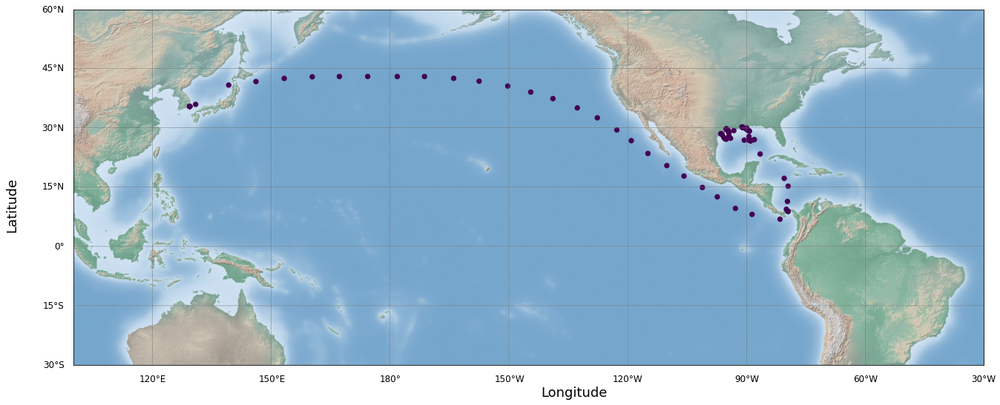

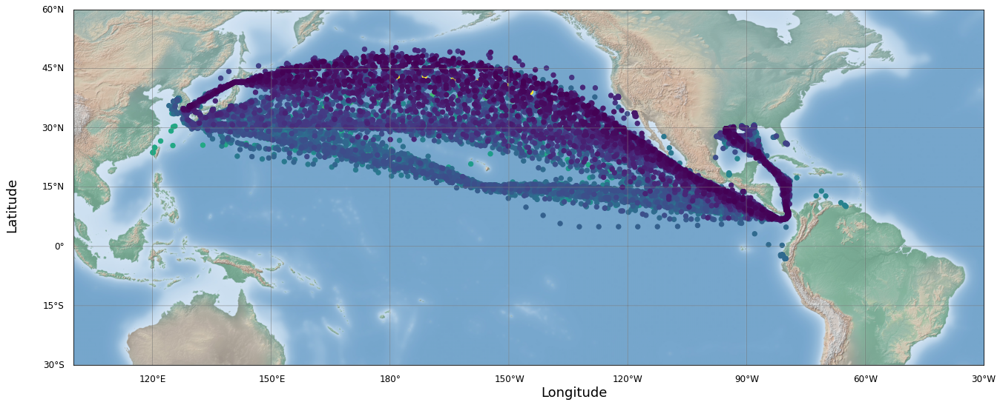

In [199]:

df_Bu2Hou[['ais_position_id', 'journey_id','ais_position_timestamp',
           'journey_distance_nm','start_region','start_group', 'end_region','end_group']]
df_Bu2Hou[df_Bu2Hou.ais_position_latitude<0]
plotPorts(df_Bu2Hou[(df_Bu2Hou.journey_id==284052196)|(df_Bu2Hou.journey_id==282591142)])

# remove all the ais points in an exceptional route. 
ix=[]
for i,row in df_Bu2Hou[df_Bu2Hou.journey_id==284052196].iterrows():
    ix.append(i)
df_Bu2Hou.drop(ix,axis=0,inplace=True)

# explore the data further
print ("------------------------------------------------------------------------------------------------------------------")
print ("the two regions:",df_Bu2Hou.end_region.unique())
print ("------------------------------------------------------------------------------------------------------------------")
print ("the number of journey between Houston and Yeosu",len(df_Bu2Hou.journey_id.unique()))
print ("------------------------------------------------------------------------------------------------------------------")

ports_gulf=findmainPorts(df_ports,regionName="Gulf")
ports_ne=findmainPorts(df_ports,regionName="NE Asia")

print ("all the ports in region Gulf:",ports_gulf)
print ("------------------------------------------------------------------------------------------------------------------")
print ("all the ports in region NE Asia",ports_ne)
print ("------------------------------------------------------------------------------------------------------------------")

plotPorts(df_Bu2Hou)

#  d) save data

In [230]:
# exsiting regions around the sea
regions=df_ports.Region.unique()
regions=list(regions)
print (regions)

['SE Asia', 'Baltic', 'Black sea', 'NE Asia', 'Gulf', 'Mid East', 'East Asia', 'Mediterranean', 'English channel', 'Caribbean', 'Red sea', 'NE Ame', 'East Latin', 'South Asia', 'SE Ame', 'SW Africa', 'SW Europe', 'North sea', 'SW Ame', 'West Latin', 'West Africa', 'East Africa', 'Oceania', 'Arctic', 'NW Ame']


In [231]:
# filter data among every two regions and save data file
extractRegions(df_merge,regions)

--------------------------------------------------
Start region is: SE Asia
End region is: Baltic
End region is: Black sea
End region is: NE Asia
End region is: Gulf
End region is: Mid East
End region is: East Asia
End region is: Mediterranean
End region is: English channel
End region is: Caribbean
End region is: Red sea
End region is: NE Ame
End region is: East Latin
End region is: South Asia
End region is: SE Ame
End region is: SW Africa
End region is: SW Europe
End region is: North sea
End region is: SW Ame
End region is: West Latin
End region is: West Africa
End region is: East Africa
End region is: Oceania
End region is: Arctic
End region is: NW Ame
-------save file completed in this loop------
--------------------------------------------------
Start region is: Baltic
End region is: Black sea
End region is: NE Asia
End region is: Gulf
End region is: Mid East
End region is: East Asia
End region is: Mediterranean
End region is: English channel
End region is: Caribbean
End region is:

End region is: North sea
End region is: SW Ame
End region is: West Latin
End region is: West Africa
End region is: East Africa
End region is: Oceania
End region is: Arctic
End region is: NW Ame
-------save file completed in this loop------
--------------------------------------------------
Start region is: SW Europe
End region is: North sea
End region is: SW Ame
End region is: West Latin
End region is: West Africa
End region is: East Africa
End region is: Oceania
End region is: Arctic
End region is: NW Ame
-------save file completed in this loop------
--------------------------------------------------
Start region is: North sea
End region is: SW Ame
End region is: West Latin
End region is: West Africa
End region is: East Africa
End region is: Oceania
End region is: Arctic
End region is: NW Ame
-------save file completed in this loop------
--------------------------------------------------
Start region is: SW Ame
End region is: West Latin
End region is: West Africa
End region is: East A

In [232]:
# save the merged dataset between "ais_3000nm_weather.csv" and "ports_update1.csv". a more refined dataset is obtained.
df_merge.to_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_3000nm_full.csv",index=False)

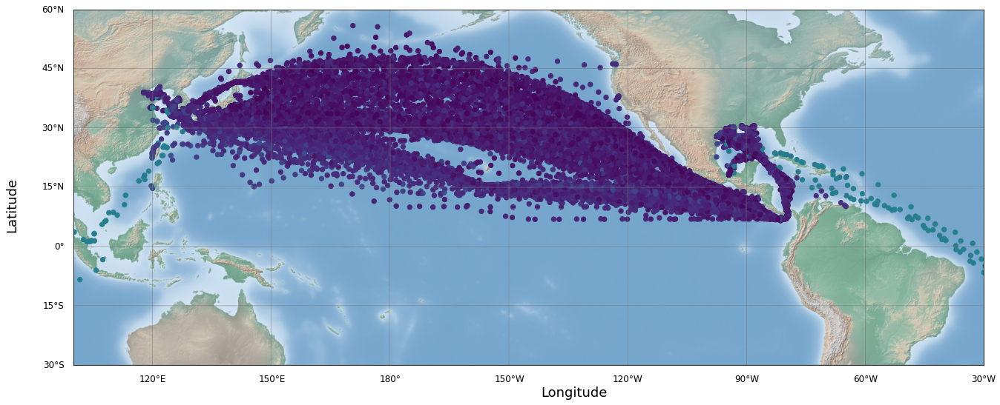

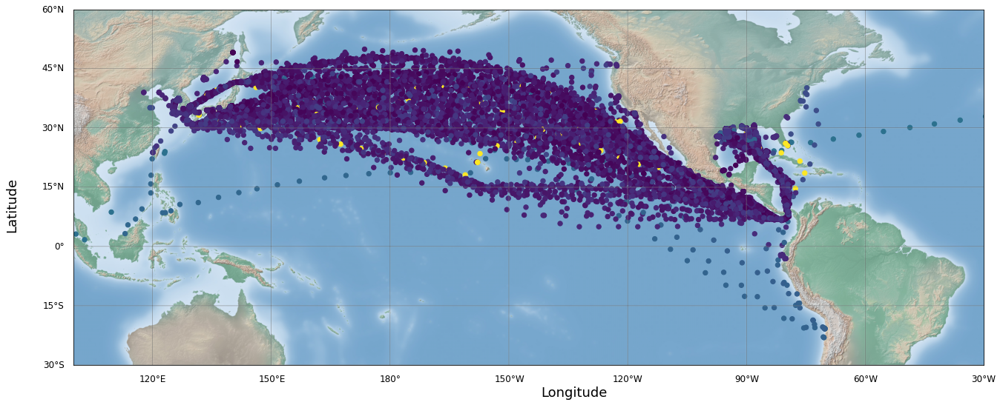

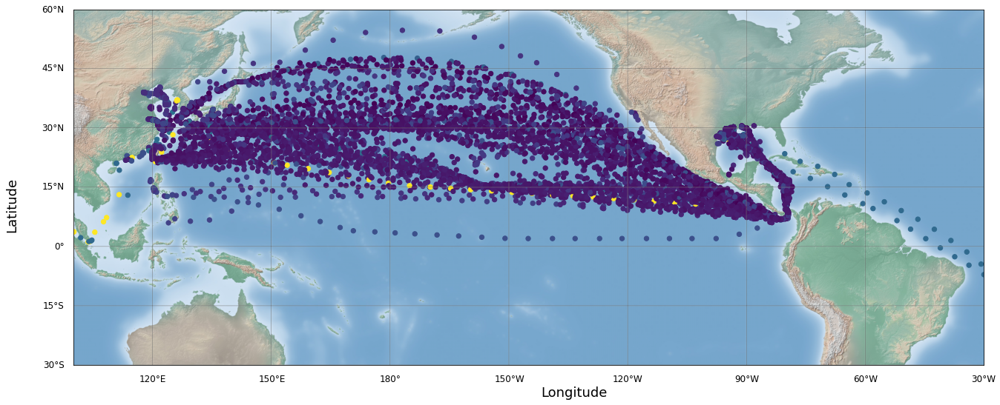

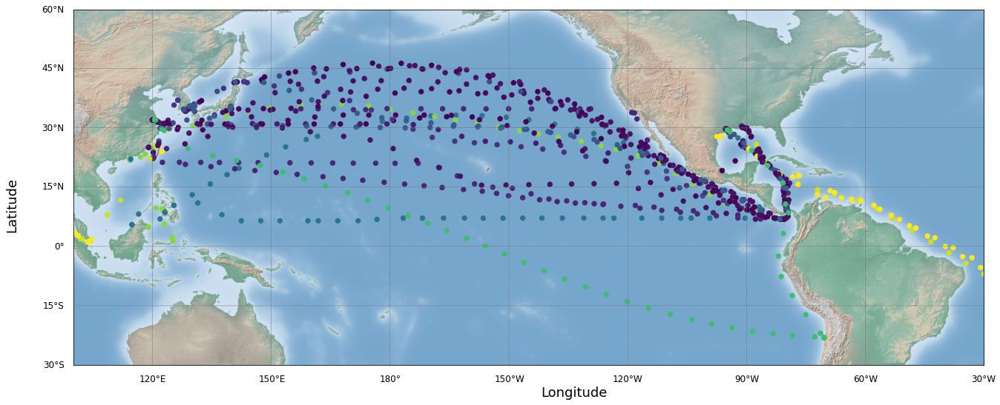

In [238]:
# routes between Gulf region and the North east Asia
df_gulf2ne=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/ais_Gulf2NE_Asia.csv")
df_gulf2ne=trans_coods(df_gulf2ne)
plotPorts(df_gulf2ne)

df_ne2gulf=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/ais_NE_Asia2Gulf.csv")
df_ne2gulf=trans_coods(df_ne2gulf)
plotPorts(df_ne2gulf)


# routes between Gulf and East Asia
df_gulf2easian=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/ais_Gulf2East_Asia.csv")
df_gulf2easian=trans_coods(df_gulf2easian)
plotPorts(df_gulf2easian)

df_easian2gulf=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/ais_East_Asia2Gulf.csv")
df_easian2gulf=trans_coods(df_easian2gulf)
plotPorts(df_easian2gulf)


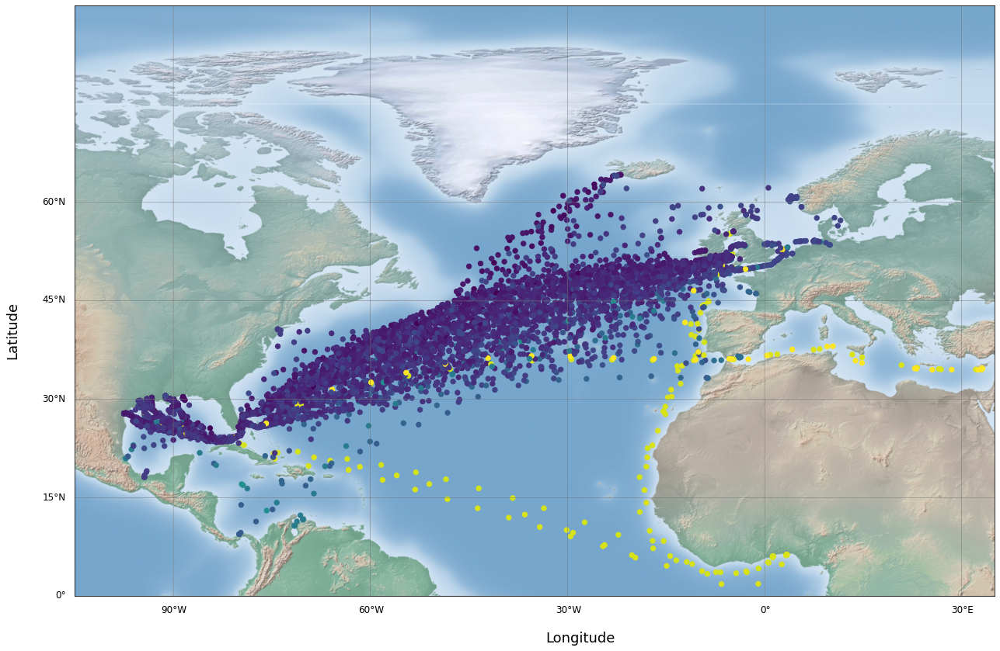

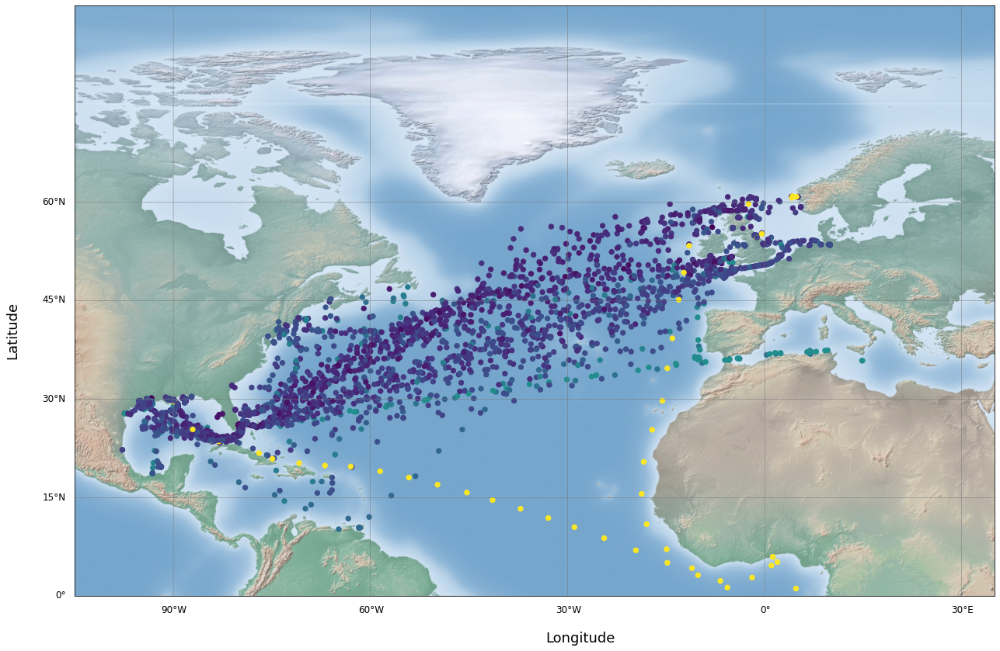

In [237]:
#  routes between Gulf region and the Northe Sea region
df_gulf2ns=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/ais_Gulf2North_sea.csv")
plotPorts_1(df_gulf2ns)

df_ns2gulf=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/ais_North_sea2Gulf.csv")
plotPorts_1(df_ns2gulf)

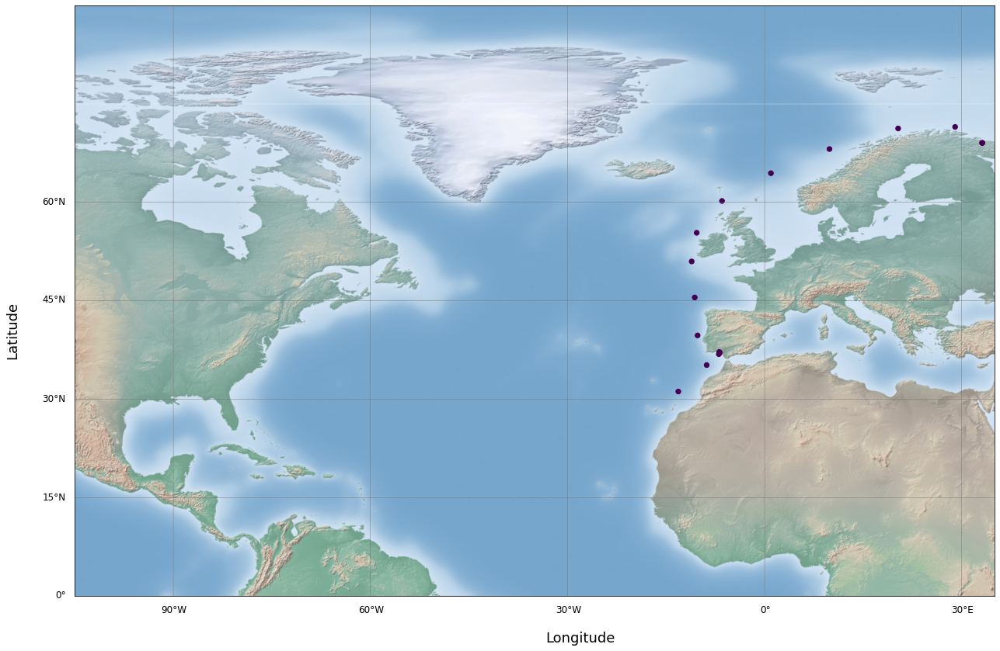

In [245]:
df_Arctic2West_Africa=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions/ais_Arctic2West_Africa.csv")
plotPorts_1(df_Arctic2West_Africa)